### Step 1: Dataset Organization and Source

In this step, the dataset used in this project is organized and standardized prior to analysis.  
The dataset consists of region-level **HRTEM nanowire images**, including both **SnTe** and **Au₂Al** material systems. All images are arranged in a consistent directory structure (e.g., `nanowire_xx/region_xx/*.png`) to enable automated batch processing in later steps.

The dataset originates from the published study:

**Naijia Liu et al., *General Nanomolding of Ordered Phases*, Physical Review Letters 124, 036102 (2020)** :contentReference[oaicite:0]{index=0}  

In that work, thermomechanical nanomolding (TMNM) was used to fabricate single-crystalline nanowires such as SnTe and Au₂Al. TEM characterization confirmed that these nanowires maintain uniform crystal orientation and composition along their length.

For this project, only region-level HRTEM images were extracted and reorganized into a unified dataset directory to support preprocessing, multi-window FFT analysis, and quantitative orientation evaluation in subsequent steps.

### Step 2-1: Read All Region Image Paths

In this step, all region-level HRTEM images are collected from the dataset directory.  
Only `.png` files located in folders containing **"region"** are selected, while SAED images are excluded.

An **index–filename mapping** is then created to simplify later processing.

Basic metadata is also extracted from the file paths, including the **nanowire ID** and **region ID**, which will be used for grouping and analysis in later steps.

In [33]:
from pathlib import Path
import requests

RAW_ROOT = Path("https://github.com/yueliyu2027-bit/matsci465-project/tree/main/data/raw")

def is_region_png(p):
    parts = [x.lower() for x in p.parts]
    if "saed" in parts:
        return False
    if "region_" not in p.as_posix().lower():
        return False
    return p.suffix.lower() == ".png"

# 用 GitHub API 递归获取整个仓库文件树
api_url = "https://api.github.com/repos/yueliyu2027-bit/matsci465-project/git/trees/main?recursive=1"
response = requests.get(api_url)
files = response.json()["tree"]

png_files = sorted([
    Path(f["path"]) for f in files
    if f["type"] == "blob"
    and f["path"].startswith("data/raw")
    and f["path"].lower().endswith(".png")
    and is_region_png(Path(f["path"]))
])

print("Number of region images:", len(png_files))
for p in png_files:
    print(p)

Number of region images: 7
data\raw\Au2Al\nanowire_01\region_01\Au2Al_wire1_region1.png
data\raw\SnTe\nanowire_01\region_01\SnTe_HRTEM_1.png
data\raw\SnTe\nanowire_01\region_02\SnTe_HRTEM_2.png
data\raw\SnTe\nanowire_01\region_03\SnTe_HRTEM_3.png
data\raw\SnTe\nanowire_01\region_04\SnTe_HRTEM_4.png
data\raw\SnTe\nanowire_02\region_01\SnTe_wire2_region1.png
data\raw\SnTe\nanowire_03\region_01\SnTe_wire3_region1.png


In [34]:
# Step 2-1 (update): index-to-filename mapping
image_names = [p.as_posix() for p in png_files]

print("Index -> filename mapping")
for i, n in enumerate(image_names):
    print(f"Image {i}: {n}")

Index -> filename mapping
Image 0: data/raw/Au2Al/nanowire_01/region_01/Au2Al_wire1_region1.png
Image 1: data/raw/SnTe/nanowire_01/region_01/SnTe_HRTEM_1.png
Image 2: data/raw/SnTe/nanowire_01/region_02/SnTe_HRTEM_2.png
Image 3: data/raw/SnTe/nanowire_01/region_03/SnTe_HRTEM_3.png
Image 4: data/raw/SnTe/nanowire_01/region_04/SnTe_HRTEM_4.png
Image 5: data/raw/SnTe/nanowire_02/region_01/SnTe_wire2_region1.png
Image 6: data/raw/SnTe/nanowire_03/region_01/SnTe_wire3_region1.png


In [35]:
# parse metadata from path
def parse_metadata(p):
    parts = p.parts
    nanowire = [x for x in parts if "nanowire" in x.lower()]
    region = [x for x in parts if "region" in x.lower()]

    return {
        "file": p.as_posix(),
        "nanowire": nanowire[0] if nanowire else "unknown",
        "region": region[0] if region else "unknown"
    }

metadata = [parse_metadata(p) for p in png_files]

print("Metadata preview:")
for m in metadata:
    print(m)

Metadata preview:
{'file': 'data/raw/Au2Al/nanowire_01/region_01/Au2Al_wire1_region1.png', 'nanowire': 'nanowire_01', 'region': 'region_01'}
{'file': 'data/raw/SnTe/nanowire_01/region_01/SnTe_HRTEM_1.png', 'nanowire': 'nanowire_01', 'region': 'region_01'}
{'file': 'data/raw/SnTe/nanowire_01/region_02/SnTe_HRTEM_2.png', 'nanowire': 'nanowire_01', 'region': 'region_02'}
{'file': 'data/raw/SnTe/nanowire_01/region_03/SnTe_HRTEM_3.png', 'nanowire': 'nanowire_01', 'region': 'region_03'}
{'file': 'data/raw/SnTe/nanowire_01/region_04/SnTe_HRTEM_4.png', 'nanowire': 'nanowire_01', 'region': 'region_04'}
{'file': 'data/raw/SnTe/nanowire_02/region_01/SnTe_wire2_region1.png', 'nanowire': 'nanowire_02', 'region': 'region_01'}
{'file': 'data/raw/SnTe/nanowire_03/region_01/SnTe_wire3_region1.png', 'nanowire': 'nanowire_03', 'region': 'region_01'}


### Step 2-2 (Batch Version): Read and Inspect All Region Images

In this step, all region images are loaded to perform a quick data integrity check.  
We verify that each image can be successfully read and inspect basic properties such as image shape and data type.

A sample image is also displayed to visually confirm that the image content is correct and suitable for further analysis.

This step only inspects the images and does not perform any preprocessing.

Au2Al_wire1_region1.png    shape=(314, 364, 4)  dtype=uint8
SnTe_HRTEM_1.png           shape=(422, 448, 4)  dtype=uint8
SnTe_HRTEM_2.png           shape=(682, 730, 4)  dtype=uint8
SnTe_HRTEM_3.png           shape=(684, 708, 4)  dtype=uint8
SnTe_HRTEM_4.png           shape=(423, 442, 4)  dtype=uint8
SnTe_wire2_region1.png     shape=(433, 444, 4)  dtype=uint8
SnTe_wire3_region1.png     shape=(398, 455, 4)  dtype=uint8

Total images: 7


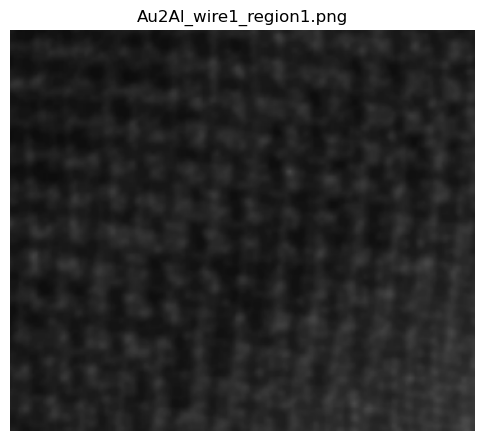

In [37]:
from skimage.io import imread
import matplotlib.pyplot as plt

shapes = []
dtypes = []

for p in png_files:
    img = imread(p)
    shapes.append(img.shape)
    dtypes.append(img.dtype)
    print(f"{p.name:25s}  shape={img.shape}  dtype={img.dtype}")

print("\nTotal images:", len(png_files))

# 抽样显示第一张（你也可以改成其他索引，比如 png_files[3]）
idx = 0
img0 = imread(png_files[idx])

plt.figure(figsize=(6,6))
plt.imshow(img0, cmap="gray")
plt.title(png_files[idx].name)
plt.axis("off")
plt.show()

### Step 2-3: Convert Images to Grayscale

Since some images are stored in RGBA format (4 channels), the alpha channel is removed first and only the RGB channels are kept.

All images are then converted to grayscale to simplify later frequency-domain analysis.  
The processed grayscale images are stored in a list called `gray_images` for subsequent steps.

In [38]:
from skimage.color import rgb2gray

gray_images = []

for p in png_files:
    img = imread(p)

    # If RGBA (4 channels), drop alpha channel -> RGB
    if img.ndim == 3 and img.shape[2] == 4:
        img = img[:, :, :3]

    # If already grayscale (2D), keep it; else convert RGB -> gray
    if img.ndim == 2:
        gray = img.astype("float32") / 255.0
    else:
        gray = rgb2gray(img)

    gray_images.append(gray)

print("Total grayscale images:", len(gray_images))
print("Example grayscale shape:", gray_images[0].shape)
print("Gray range example:", gray_images[0].min(), gray_images[0].max())

Total grayscale images: 7
Example grayscale shape: (314, 364)
Gray range example: 0.047058823529411764 0.28627450980392155


### Step 2-4 (Optional): Apply Light Gaussian Blur for Noise Reduction

HRTEM images may contain high-frequency noise.  
A light Gaussian blur can reduce noise while preserving lattice periodicity, which helps stabilize FFT peak detection.

In this step, a small Gaussian filter (e.g., `sigma = 0.6`) is optionally applied to each grayscale image, and the results are stored in `blur_images`.

In [39]:
from skimage.filters import gaussian

SIGMA = 0.6

blur_images = []

for img in gray_images:
    blur = gaussian(img, sigma=SIGMA, preserve_range=True)
    blur_images.append(blur)

print("Total blurred images:", len(blur_images))
print("Example blurred range:", blur_images[0].min(), blur_images[0].max())

Total blurred images: 7
Example blurred range: 0.0470890407516876 0.2854441451917137


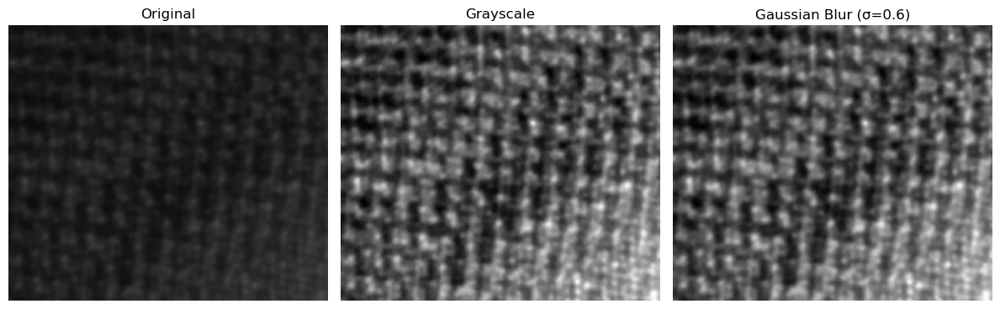

In [40]:
# =========================
# Show data-preparation results (Original → Gray → Blur)
# =========================

# 👉 改这里选SnTe编号（用你前面print mapping选）
idx = 0

orig = imread(png_files[idx])
gray = gray_images[idx]
blur = blur_images[idx]

fig, axes = plt.subplots(1, 3, figsize=(12,4))

# Original
axes[0].imshow(orig, cmap="gray")
axes[0].set_title("Original")
axes[0].axis("off")

# Grayscale
axes[1].imshow(gray, cmap="gray")
axes[1].set_title("Grayscale")
axes[1].axis("off")

# Blur
axes[2].imshow(blur, cmap="gray")
axes[2].set_title("Gaussian Blur (σ=0.6)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

### Step 3-1: Perform FFT on All Images

In this step, we compute the **2D Fast Fourier Transform (FFT)** for each preprocessed image to analyze lattice periodicity in reciprocal space.

For each image:
- The FFT is computed using `fft2`.
- The spectrum is centered using `fftshift`.
- The magnitude of the FFT is calculated.
- Log scaling (`log1p`) is applied to improve visualization of diffraction peaks.

The centered FFT results, magnitudes, and log-magnitude spectra are stored for later analysis.

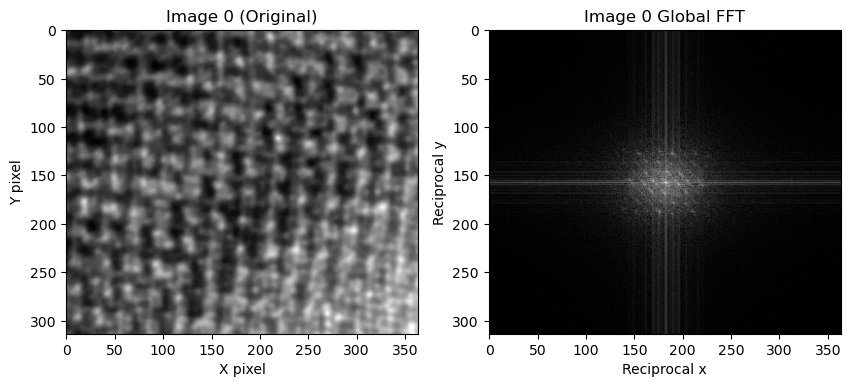

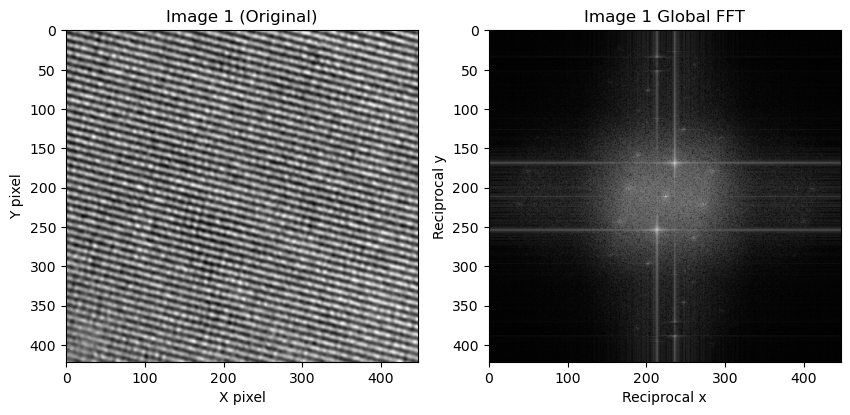

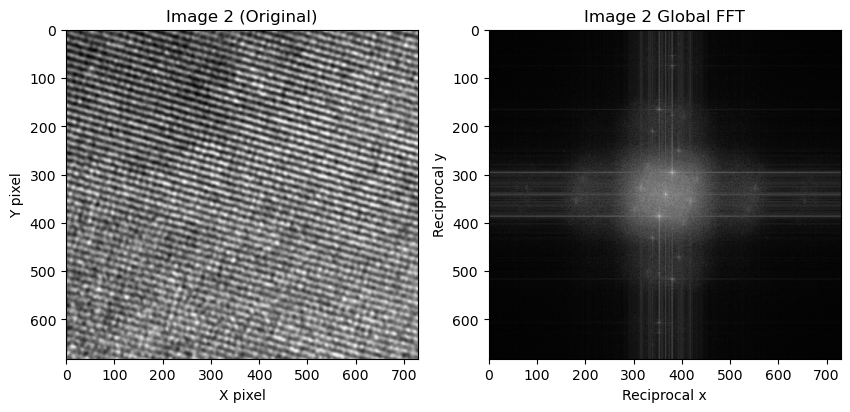

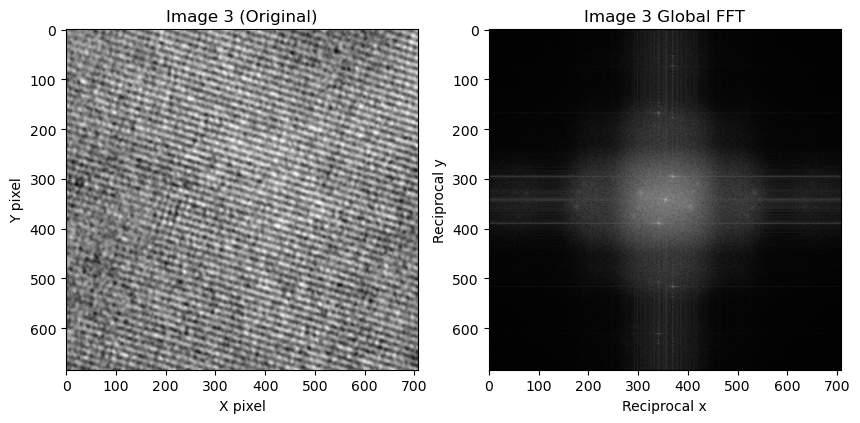

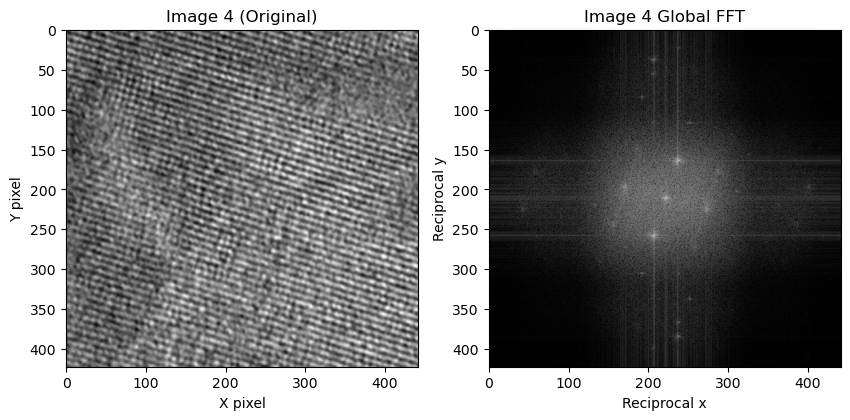

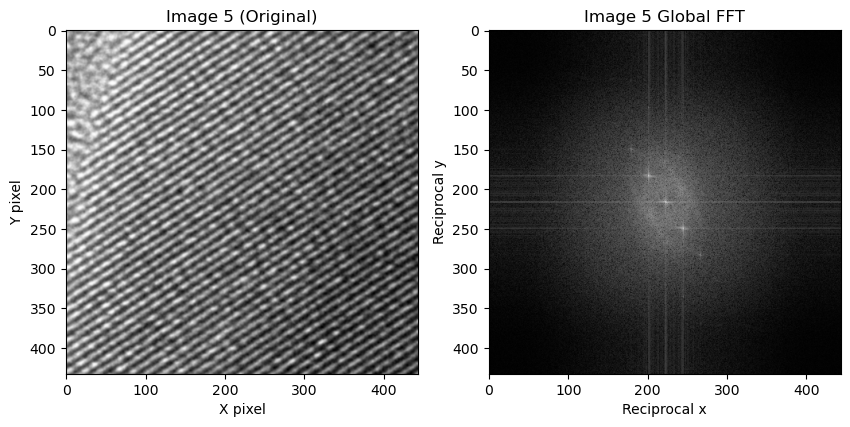

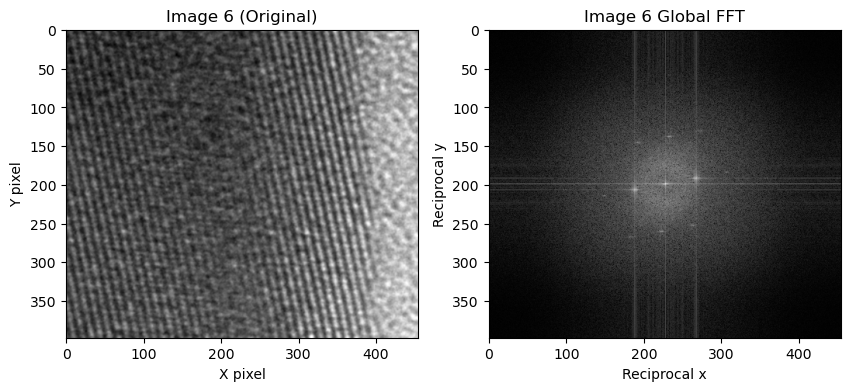

In [41]:
# Step 3-1: Show original image and its global FFT side-by-side for all images

import numpy as np
import matplotlib.pyplot as plt

fft_logs_global = []

for img_idx, img in enumerate(blur_images):

    # ===== Compute FFT =====
    F = np.fft.fftshift(np.fft.fft2(img))
    mag = np.abs(F)
    fft_log = np.log1p(mag)

    fft_logs_global.append(fft_log)

    # ===== Plot side-by-side =====
    fig, axes = plt.subplots(1, 2, figsize=(10, 4.5))

    # Original image
    axes[0].imshow(img, cmap='gray')
    axes[0].set_title(f'Image {img_idx} (Original)')
    axes[0].set_xlabel('X pixel')
    axes[0].set_ylabel('Y pixel')

    # FFT image
    axes[1].imshow(fft_log, cmap='gray')
    axes[1].set_title(f'Image {img_idx} Global FFT')
    axes[1].set_xlabel('Reciprocal x')
    axes[1].set_ylabel('Reciprocal y')

    plt.show()

### Step 3-2: Remove the Central DC Peak

The FFT spectrum contains a very bright **central DC peak** corresponding to the zero-frequency component (average image intensity).  
This peak does not contain structural information and can interfere with peak detection.

To remove its influence, a small circular region around the FFT center is masked and set to zero.  
The filtered FFT magnitude images are stored for subsequent peak detection.

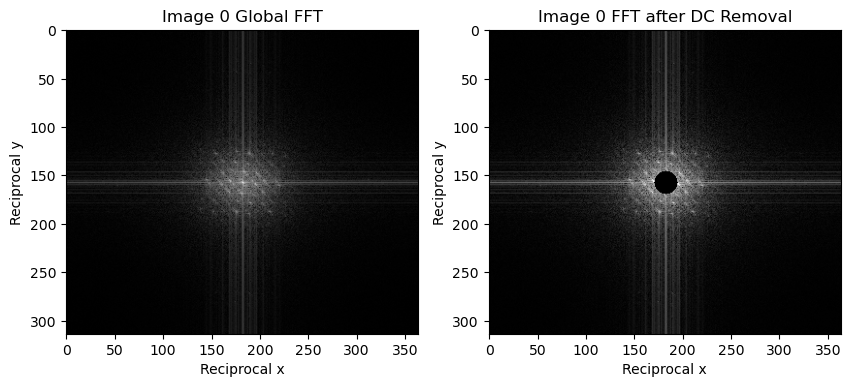

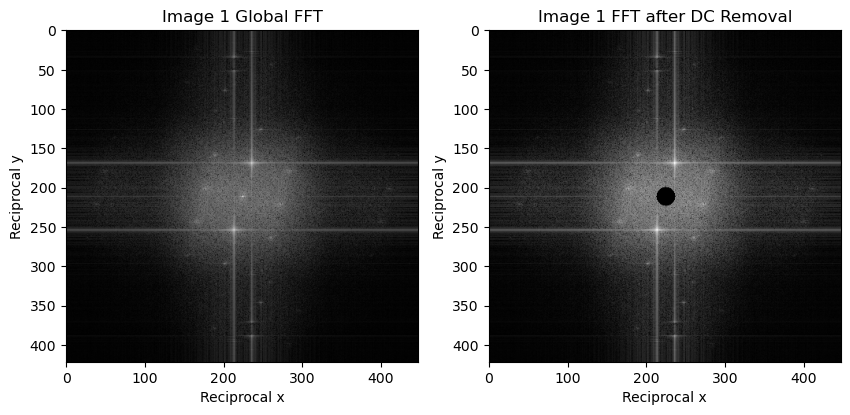

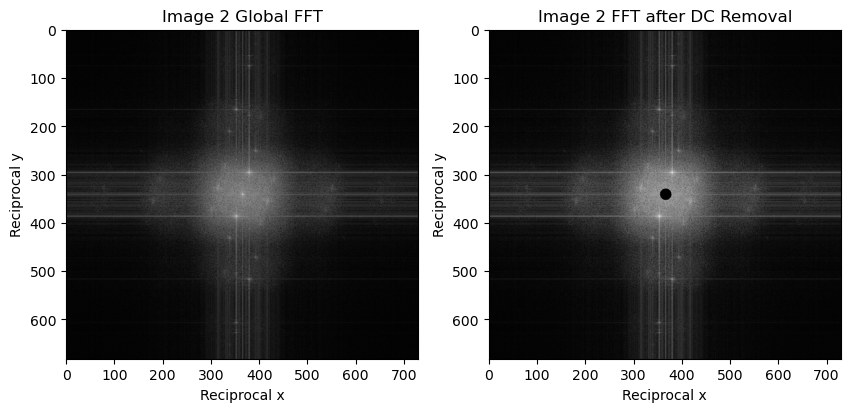

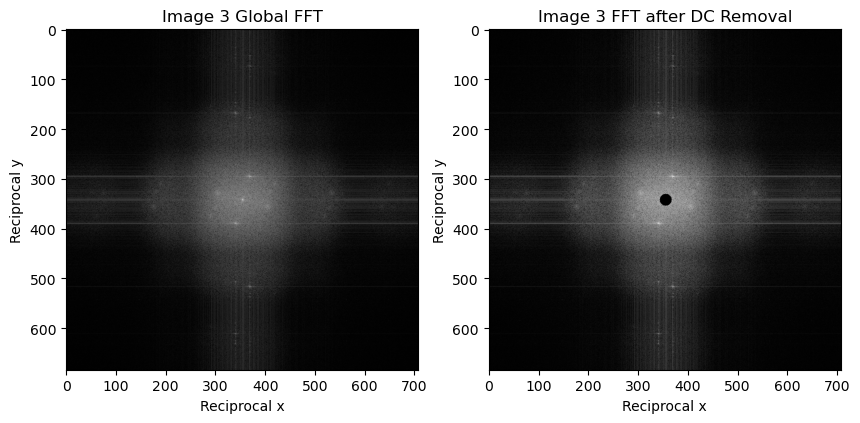

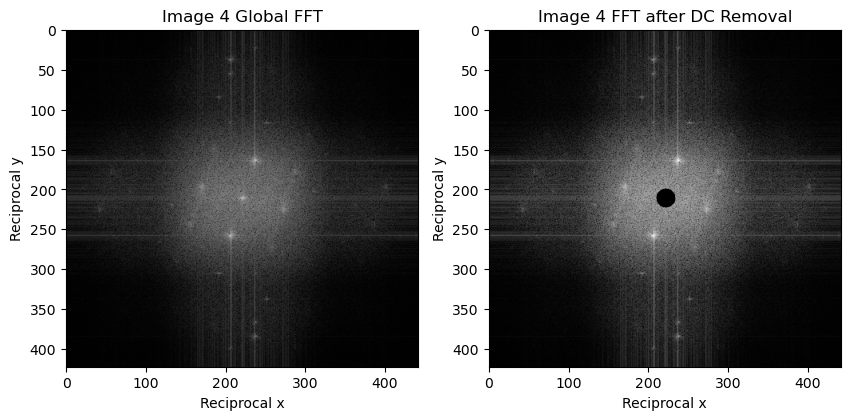

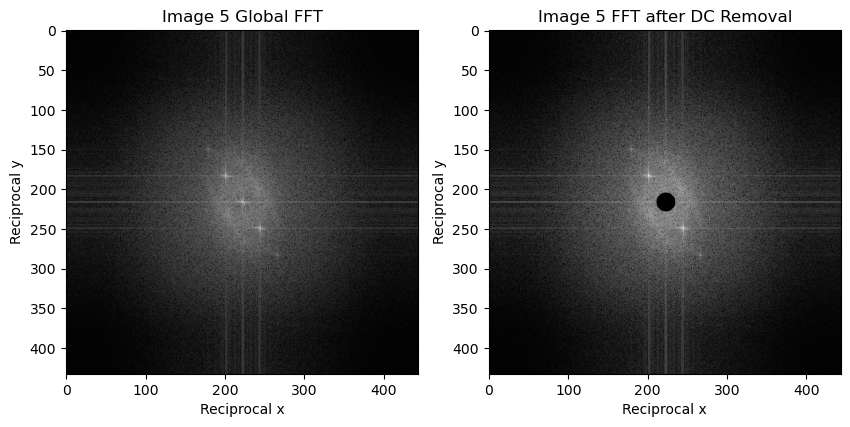

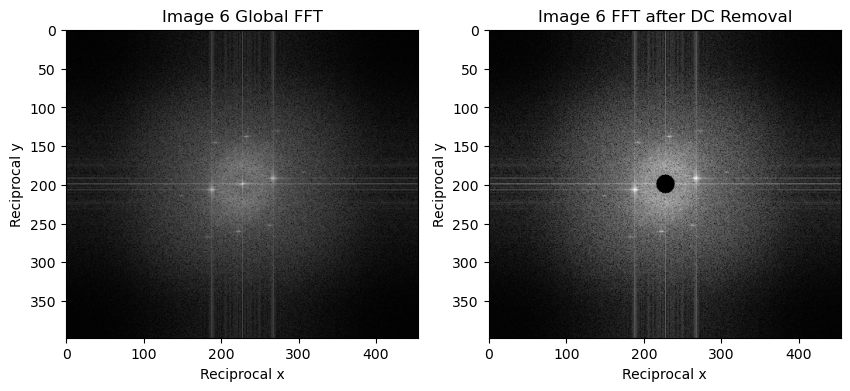

In [42]:
# Step 3-2: Remove central DC region for all FFT images

import numpy as np
import matplotlib.pyplot as plt

dc_radius = 12   # you can tune this later if needed

fft_logs_dc_removed = []
dc_masks_all = []

for img_idx, fft_log in enumerate(fft_logs_global):

    h, w = fft_log.shape
    cy, cx = h // 2, w // 2

    # Create circular DC mask
    yy, xx = np.ogrid[:h, :w]
    dc_mask = (yy - cy)**2 + (xx - cx)**2 <= dc_radius**2

    fft_dc_removed = fft_log.copy()
    fft_dc_removed[dc_mask] = 0

    fft_logs_dc_removed.append(fft_dc_removed)
    dc_masks_all.append(dc_mask)

    # Plot original FFT and DC-removed FFT side by side
    fig, axes = plt.subplots(1, 2, figsize=(10, 4.5))

    axes[0].imshow(fft_log, cmap='gray')
    axes[0].set_title(f'Image {img_idx} Global FFT')
    axes[0].set_xlabel('Reciprocal x')
    axes[0].set_ylabel('Reciprocal y')

    axes[1].imshow(fft_dc_removed, cmap='gray')
    axes[1].set_title(f'Image {img_idx} FFT after DC Removal')
    axes[1].set_xlabel('Reciprocal x')
    axes[1].set_ylabel('Reciprocal y')

    plt.show()

### Step 3-3: Automatically Detect FFT Peaks

In the FFT magnitude spectrum, lattice periodicities appear as **bright diffraction peaks**.

To identify these peaks:
- A radial mask is applied to ignore the central region and outer noise.
- `peak_local_max` is used to detect bright peaks.
- A maximum number of peaks is kept to reduce noise.

The detected peak coordinates for each image are stored for orientation analysis.

In [47]:
from skimage.feature import peak_local_max

fft_peaks_list = []

for mag in fft_filtered_list:

    h, w = mag.shape
    cy, cx = h//2, w//2

    Y, X = np.ogrid[:h, :w]
    r = np.sqrt((Y-cy)**2 + (X-cx)**2)

    # ring mask (remove cross artifacts)
    r_min = 20
    r_max = min(h, w) * 0.45

    ring_mask = (r > r_min) & (r < r_max)

    mag_ring = mag * ring_mask

    peaks = peak_local_max(
        mag_ring,
        min_distance=10,
        num_peaks=20
    )

    fft_peaks_list.append(peaks)

print("Peak sets detected:", len(fft_peaks_list))
print("Example number of peaks:", len(fft_peaks_list[0]))

Peak sets detected: 7
Example number of peaks: 20


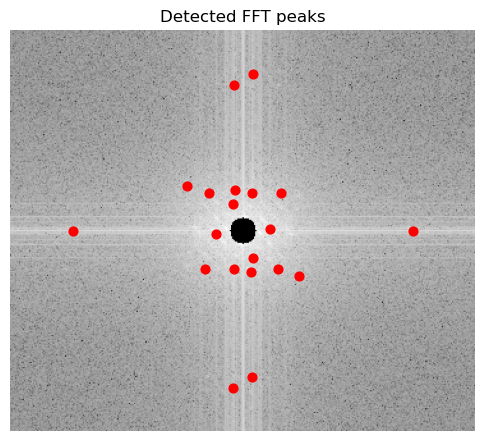

In [48]:
idx = 0

peaks = fft_peaks_list[idx]

plt.figure(figsize=(6,6))
plt.imshow(np.log1p(fft_filtered_list[idx]), cmap="gray")

plt.scatter(peaks[:,1], peaks[:,0], 
            c="red", s=40)

plt.title("Detected FFT peaks")
plt.axis("off")
plt.show()

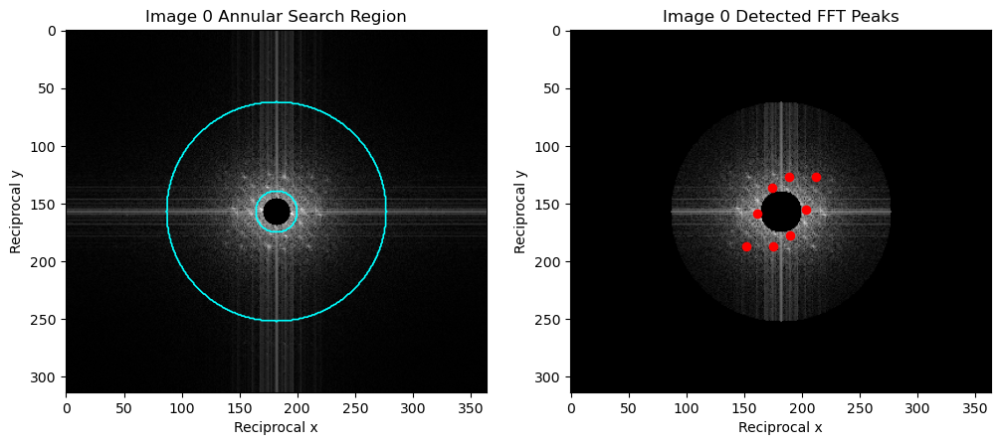

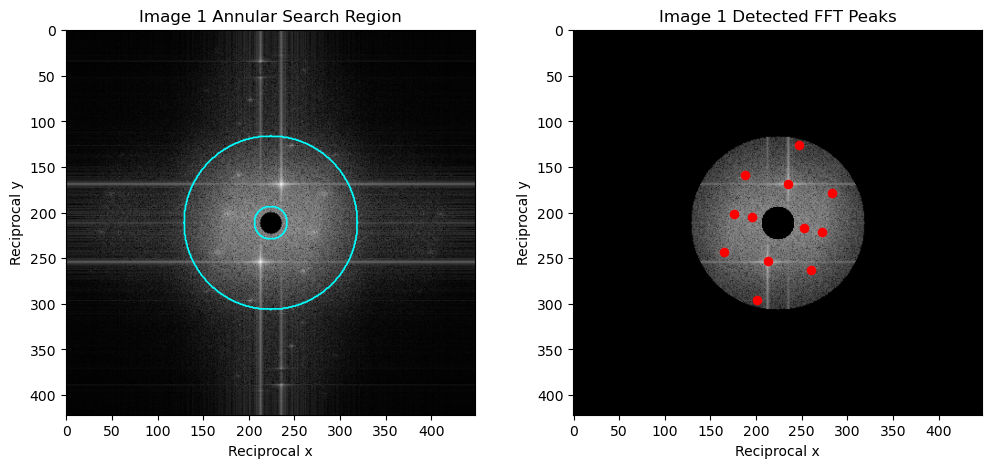

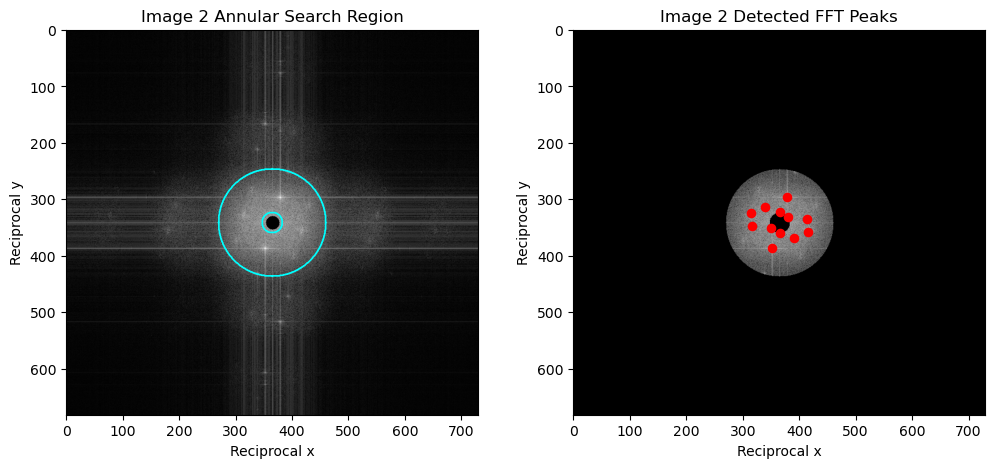

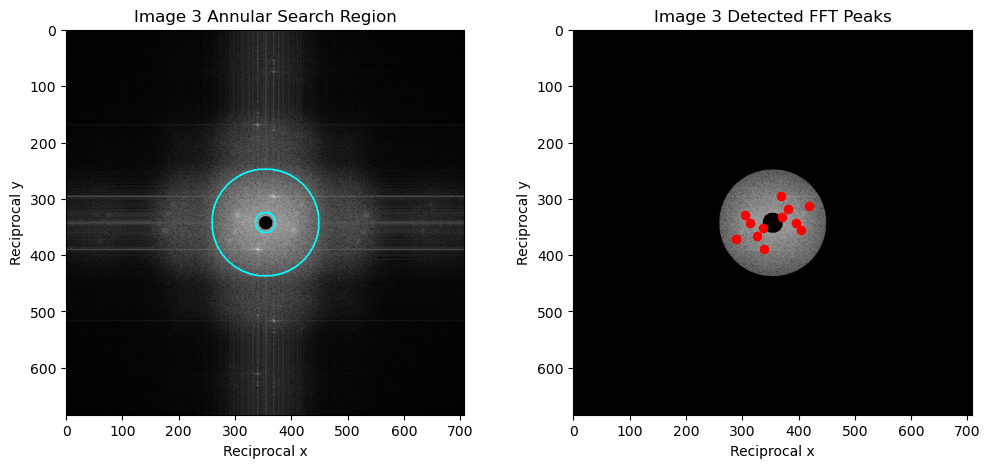

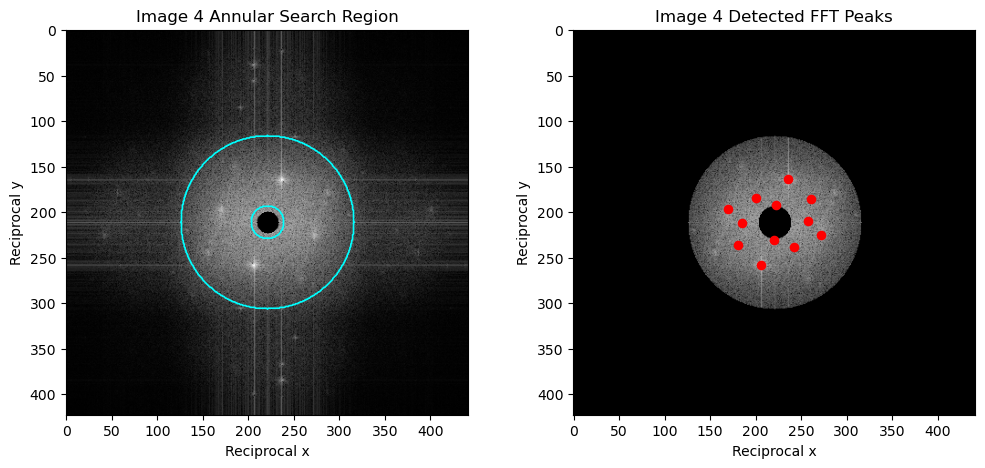

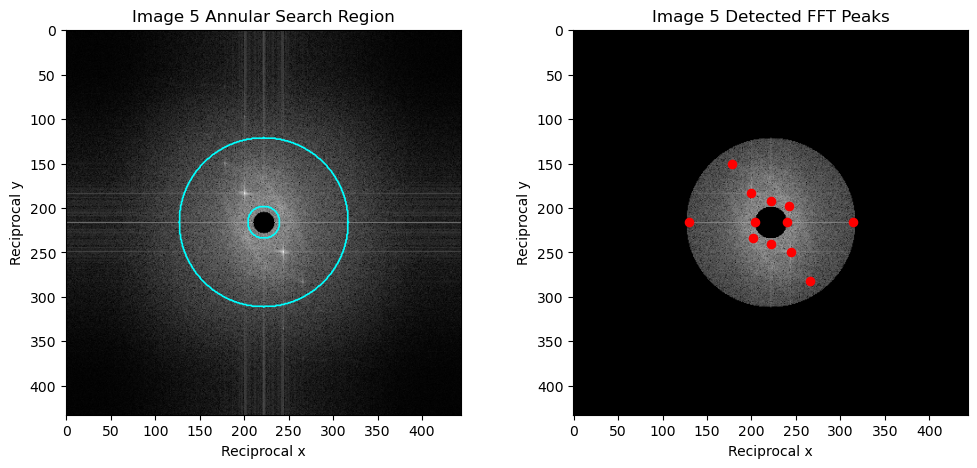

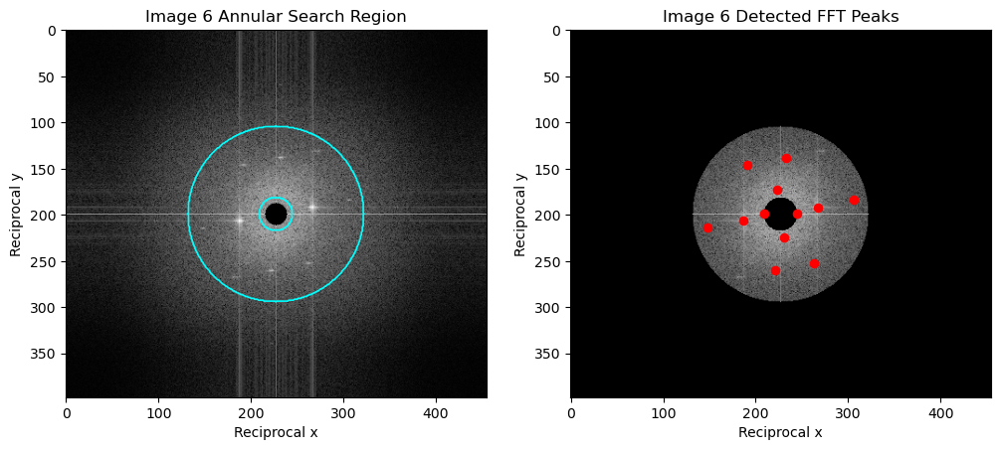

In [49]:
# Step 3-3: Detect FFT peaks within an annular search region for all images

import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import peak_local_max

# ===== Parameters =====
r_min = 18          # inner radius: avoid center/DC region
r_max = 95         # outer radius: avoid far noisy region
min_distance = 12   # minimum spacing between detected peaks
num_peaks = 12      # maximum number of peaks to detect
threshold_rel = 0.22  # relative intensity threshold for peak detection

fft_peak_coords_all = []
fft_search_masks_all = []

for img_idx, fft_dc_removed in enumerate(fft_logs_dc_removed):

    h, w = fft_dc_removed.shape
    cy, cx = h // 2, w // 2

    # ===== Build annular search mask =====
    yy, xx = np.ogrid[:h, :w]
    rr = np.sqrt((yy - cy)**2 + (xx - cx)**2)

    annular_mask = (rr >= r_min) & (rr <= r_max)

    # Apply mask: only keep pixels inside annular region
    fft_for_peaks = fft_dc_removed.copy()
    fft_for_peaks[~annular_mask] = 0

    # ===== Peak detection only inside masked region =====
    peaks = peak_local_max(
        fft_for_peaks,
        min_distance=min_distance,
        threshold_rel=threshold_rel,
        num_peaks=num_peaks
    )

    fft_peak_coords_all.append(peaks)
    fft_search_masks_all.append(annular_mask)

    # ===== Visualization =====
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Left: annular search region
    axes[0].imshow(fft_dc_removed, cmap='gray')
    axes[0].contour(annular_mask, levels=[0.5], colors='cyan', linewidths=1.2)
    axes[0].set_title(f'Image {img_idx} Annular Search Region')
    axes[0].set_xlabel('Reciprocal x')
    axes[0].set_ylabel('Reciprocal y')

    # Right: detected peaks
    axes[1].imshow(fft_for_peaks, cmap='gray')
    if len(peaks) > 0:
        axes[1].scatter(peaks[:, 1], peaks[:, 0], c='red', s=35)
    axes[1].set_title(f'Image {img_idx} Detected FFT Peaks')
    axes[1].set_xlabel('Reciprocal x')
    axes[1].set_ylabel('Reciprocal y')

    plt.show()

### Step 3-4: Compute Orientation Angle from FFT Peaks

The lattice orientation can be estimated from the direction of diffraction peaks in reciprocal space.

For each image:
- The FFT center is determined.
- Vectors from the center to detected peaks are computed.
- The strongest peak is selected.
- The orientation angle is calculated using `arctan2(dy, dx)`.

Because FFT directions correspond to reciprocal lattice directions, a 90° rotation is applied to obtain the real lattice orientation.

In [50]:
# Step 3-4: Compute global orientation angle from detected FFT peaks

import numpy as np

orientations = []

for peaks, mag in zip(fft_peak_coords_all, fft_logs_dc_removed):

    h, w = mag.shape
    cy, cx = h // 2, w // 2

    # If no peaks are detected, return NaN
    if len(peaks) == 0:
        orientations.append(np.nan)
        continue

    # Peak vectors relative to FFT center
    dy = peaks[:, 0] - cy
    dx = peaks[:, 1] - cx

    # Peak intensity values
    peak_vals = mag[peaks[:, 0], peaks[:, 1]]

    # Choose the strongest peak
    idx = np.argmax(peak_vals)
    dy0 = dy[idx]
    dx0 = dx[idx]

    # Angle in FFT space
    angle = np.degrees(np.arctan2(dy0, dx0))

    # Convert FFT direction to real-space lattice direction
    angle = angle + 90

    # Wrap to [-90, 90]
    angle = (angle + 90) % 180 - 90

    # Enforce axis symmetry
    if angle > 45:
        angle -= 90
    if angle < -45:
        angle += 90

    orientations.append(angle)

print("Orientation angles:")
for i, a in enumerate(orientations):
    if np.isnan(a):
        print(f"Image {i}: NaN")
    else:
        print(f"Image {i}: {a:.2f} degrees")

Orientation angles:
Image 0: -20.85 degrees
Image 1: 14.68 degrees
Image 2: 16.11 degrees
Image 3: 17.70 degrees
Image 4: 17.70 degrees
Image 5: -33.69 degrees
Image 6: -9.93 degrees


### Step 3-5: Normalize Orientation Angles to [-90°, 90°]

The orientation angle obtained from `arctan2` may span a larger range due to directional symmetry.

Since diffraction peaks separated by 180° represent the same lattice orientation, angles are normalized to the range **[-90°, 90°]** to ensure consistent comparison across images.

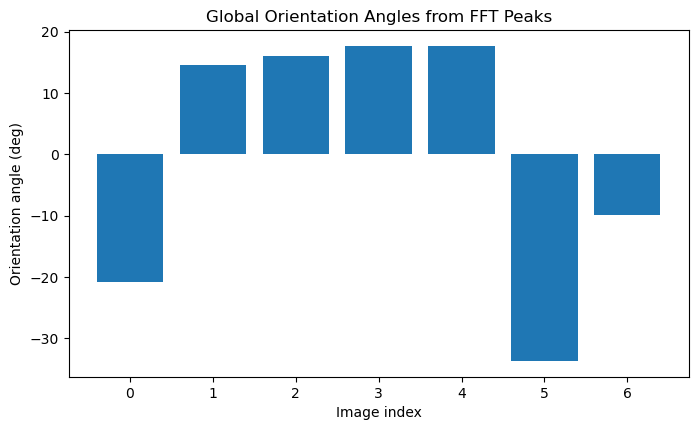

Orientation angles:
Image 0: -20.85 degrees
Image 1: 14.68 degrees
Image 2: 16.11 degrees
Image 3: 17.70 degrees
Image 4: 17.70 degrees
Image 5: -33.69 degrees
Image 6: -9.93 degrees


In [51]:
# Step 3-5: Visualize global orientation angles for all images

import numpy as np
import matplotlib.pyplot as plt

image_ids = np.arange(len(orientations))

plt.figure(figsize=(8, 4.5))
plt.bar(image_ids, orientations)

plt.xlabel('Image index')
plt.ylabel('Orientation angle (deg)')
plt.title('Global Orientation Angles from FFT Peaks')
plt.xticks(image_ids)

plt.show()

print("Orientation angles:")
for i, a in enumerate(orientations):
    if np.isnan(a):
        print(f"Image {i}: NaN")
    else:
        print(f"Image {i}: {a:.2f} degrees")

## Step 4-1: Divide Each HRTEM Image into Fixed-Size Windows  

### Explanation  

Global FFT provides a single orientation value for the entire image, but nanowires may exhibit local orientation variations along the wire.  

To analyze these spatial variations, we divide each HRTEM image into small overlapping windows and perform FFT on each window separately.

In this step we:

1. Define a fixed window size (e.g., **128 × 128 pixels**)  
2. Slide the window across the image with a fixed step (**64 pixels**)  
3. Extract local image patches  
4. Normalize each patch using min–max normalization to the range **[0, 1]**  
5. Store the window patches and their center coordinates  

These windows will later be used for local FFT-based orientation analysis.

In [52]:
import numpy as np

window_size = 128
step = 64

def get_start_positions(length, window_size, step):
    """
    Generate window start positions that guarantee full coverage.
    The last window is forced to touch the image boundary.
    """
    if length < window_size:
        raise ValueError(
            f"Image dimension ({length}) is smaller than window_size ({window_size})."
        )

    starts = list(range(0, length - window_size + 1, step))

    last_start = length - window_size
    if starts[-1] != last_start:
        starts.append(last_start)

    return starts


windows_all = []
coords_all = []
grid_shapes_all = []

for img in blur_images:
    h, w = img.shape

    y_starts = get_start_positions(h, window_size, step)
    x_starts = get_start_positions(w, window_size, step)

    windows = []
    coords = []

    for y in y_starts:
        for x in x_starts:
            patch = img[y:y + window_size, x:x + window_size]
            windows.append(patch)
            coords.append((y, x))

    windows_all.append(windows)
    coords_all.append(coords)
    grid_shapes_all.append((len(y_starts), len(x_starts)))

print("Number of images:", len(windows_all))
print("Image 0 grid shape:", grid_shapes_all[0])
print("Image 0 number of windows:", len(windows_all[0]))
print("Example window shape:", windows_all[0][0].shape)

Number of images: 7
Image 0 grid shape: (4, 5)
Image 0 number of windows: 20
Example window shape: (128, 128)


## Step 4-2: Compute Local Orientation from Each Window Using FFT

### Explanation

In this step, we compute the local lattice orientation from each image patch using FFT peak detection.

For each patch:

1. Compute the 2D FFT and shift it to center
2. Remove the DC component (central low-frequency region)
3. Detect local maxima (FFT peaks)
4. Apply radial filtering to keep peaks within a valid frequency band
5. Reject FFT cross artifacts near the horizontal/vertical axes
6. Select the strongest remaining peak
7. Convert its position to an orientation angle (wrapped to [-90°, 90°))

If no valid peak is found, the angle is set to `NaN`.

---

### Output per Image

For each image, we store:

- `local_angles_all` → orientation angles of all windows  
- `local_strength_all` → FFT peak intensity (orientation strength)  
- `local_coords_all` → window coordinates  
- `local_valid_ratio` → fraction of windows with valid orientation  

This produces a spatial map of local crystallographic orientation for each HRTEM image.

In [53]:
import numpy as np
from skimage.feature import peak_local_max

def wrap_angle_deg(theta):
    """
    Wrap angle into [-90, 90).
    """
    theta = (theta + 180) % 360 - 180
    if theta >= 90:
        theta -= 180
    if theta < -90:
        theta += 180
    return theta


def fft_orientation_from_patch(
    patch,
    dc_radius=8,
    min_distance=6,
    num_peaks=20,
    r_min=10
):
    """
    Compute the dominant lattice orientation from one local image patch.
    
    Returns
    -------
    angle_deg : float or np.nan
        Dominant orientation angle in degrees.
    fft_log : 2D array
        Log FFT magnitude image.
    peak_coords : 2D array
        Peak coordinates after filtering.
    """

    # FFT magnitude
    F = np.fft.fftshift(np.fft.fft2(patch))
    mag = np.abs(F)
    fft_log = np.log1p(mag)

    h, w = fft_log.shape
    cy, cx = h // 2, w // 2

    # Remove central DC region
    yy, xx = np.ogrid[:h, :w]
    dc_mask = (yy - cy)**2 + (xx - cx)**2 <= dc_radius**2

    fft_for_peaks = fft_log.copy()
    fft_for_peaks[dc_mask] = 0

    # Detect candidate peaks
    peaks = peak_local_max(
        fft_for_peaks,
        min_distance=min_distance,
        num_peaks=num_peaks
    )

    if len(peaks) == 0:
        return np.nan, fft_log, peaks

    # Keep peaks sufficiently far from center
    filtered_peaks = []
    for py, px in peaks:
        r = np.sqrt((py - cy)**2 + (px - cx)**2)
        if r >= r_min:
            filtered_peaks.append((py, px))

    filtered_peaks = np.array(filtered_peaks)

    if len(filtered_peaks) == 0:
        return np.nan, fft_log, filtered_peaks

    # Pick the strongest remaining peak
    peak_values = [fft_for_peaks[py, px] for py, px in filtered_peaks]
    best_idx = np.argmax(peak_values)
    py, px = filtered_peaks[best_idx]

    dy = py - cy
    dx = px - cx

    angle_deg = np.degrees(np.arctan2(dy, dx))
    angle_deg = wrap_angle_deg(angle_deg)

    return angle_deg, fft_log, filtered_peaks


angles_all = []
fft_logs_all = []
peaks_all = []

for windows in windows_all:
    image_angles = []
    image_fft_logs = []
    image_peaks = []

    for patch in windows:
        angle, fft_log, peaks = fft_orientation_from_patch(patch)
        image_angles.append(angle)
        image_fft_logs.append(fft_log)
        image_peaks.append(peaks)

    angles_all.append(np.array(image_angles, dtype=float))
    fft_logs_all.append(image_fft_logs)
    peaks_all.append(image_peaks)

print("Number of images analyzed:", len(angles_all))
print("Image 0 number of angle results:", len(angles_all[0]))
print("First 10 angles from Image 0:", angles_all[0][:10])

Number of images analyzed: 7
Image 0 number of angle results: 20
First 10 angles from Image 0: [ 50.19442891  50.19442891  50.19442891  86.42366563   0.
 -90.         -90.           1.68468432  -1.24536427   0.        ]


In [54]:
angle_maps_all = []

for img_idx, angles in enumerate(angles_all):
    nrows, ncols = grid_shapes_all[img_idx]
    angle_map = angles.reshape(nrows, ncols)
    angle_maps_all.append(angle_map)

print("Number of angle maps:", len(angle_maps_all))
print("Image 0 angle map shape:", angle_maps_all[0].shape)
print("Image 0 angle map:")
print(angle_maps_all[0])

Number of angle maps: 7
Image 0 angle map shape: (4, 5)
Image 0 angle map:
[[ 50.19442891  50.19442891  50.19442891  86.42366563   0.        ]
 [-90.         -90.           1.68468432  -1.24536427   0.        ]
 [ 50.19442891  84.28940686   4.39870535   4.39870535   0.        ]
 [ -1.06091169   0.           4.39870535   0.           4.39870535]]


## Step 4-3: Convert Local Orientation Angles into a 2D Orientation Map

### Explanation

In Step 4-2, we obtained a 1D list of local orientation angles for each image  
(`local_angles_all[i]`) along with their corresponding window coordinates  
(`local_coords_all[i]`).

For visualization and spatial analysis, we reorganize these values into a 2D grid.

- Rows correspond to windows along the **y-direction**
- Columns correspond to windows along the **x-direction**
- Each grid cell stores the orientation angle of one window

### Outputs

- `angle_maps[i]` → 2D orientation map of image *i*
- `grid_shape_list[i]` → grid shape `(ny, nx)`

In [55]:
# Step 4-3: Convert angle results back to spatial orientation maps

import numpy as np

angle_maps_all = []

for img_idx, angles in enumerate(angles_all):

    # Get grid shape for this image (from Step 4-1)
    nrows, ncols = grid_shapes_all[img_idx]

    # Reshape 1D angle list back into 2D spatial map
    angle_map = angles.reshape(nrows, ncols)

    angle_maps_all.append(angle_map)


# ===== Check results =====
print("Number of angle maps:", len(angle_maps_all))
print("Image 0 angle map shape:", angle_maps_all[0].shape)
print("Image 0 angle map:\n", angle_maps_all[0])

Number of angle maps: 7
Image 0 angle map shape: (4, 5)
Image 0 angle map:
 [[ 50.19442891  50.19442891  50.19442891  86.42366563   0.        ]
 [-90.         -90.           1.68468432  -1.24536427   0.        ]
 [ 50.19442891  84.28940686   4.39870535   4.39870535   0.        ]
 [ -1.06091169   0.           4.39870535   0.           4.39870535]]


## Step 4-4: Overlay Orientation on the Original Image

### Explanation

We overlay the local orientation results directly on the original HRTEM image.

Procedure:

1. Plot the grayscale image
2. Draw semi-transparent rectangles for each window
3. Color each rectangle according to its orientation value
4. Add a colorbar ranging from -90° to 90°

Invalid windows (`NaN`) are skipped.

This visualization shows spatial orientation distribution directly on the nanowire image.

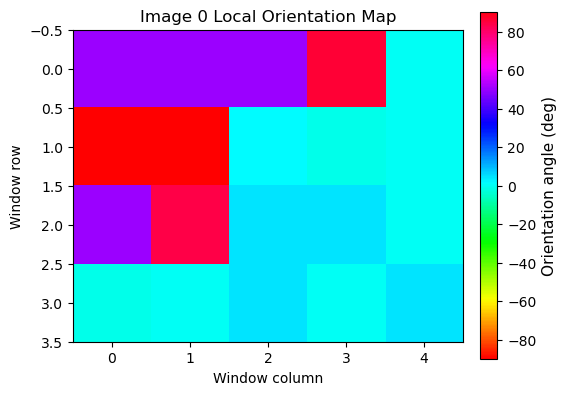

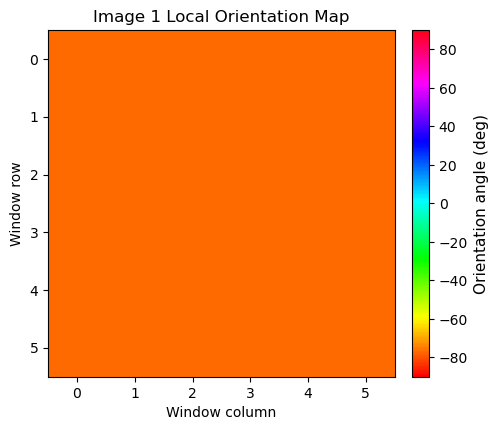

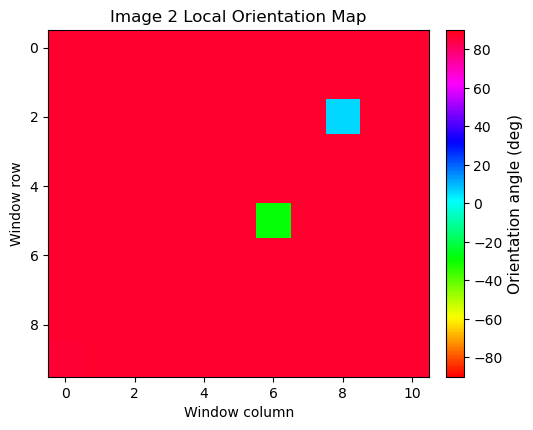

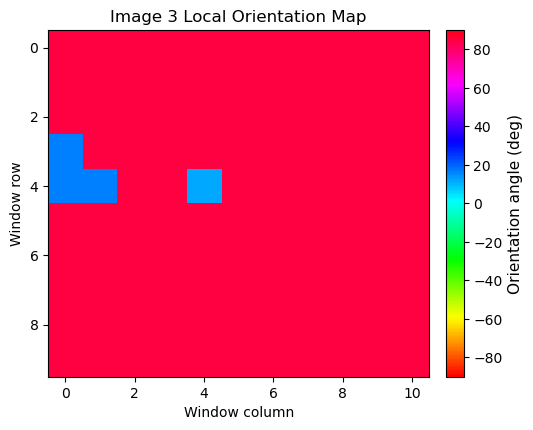

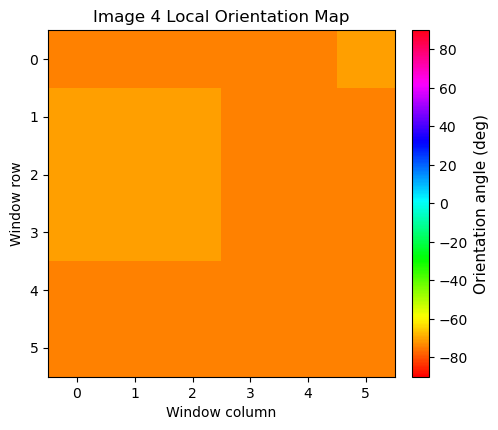

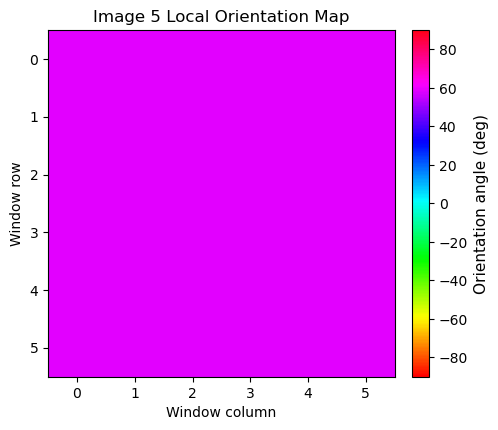

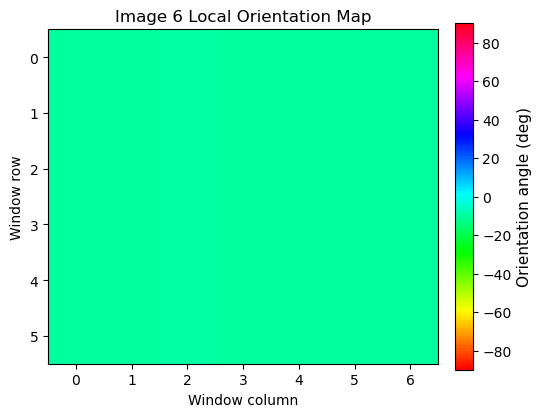

In [56]:
# Step 4-4: Plot each orientation map as an individual figure

import matplotlib.pyplot as plt

for i, angle_map in enumerate(angle_maps_all):

    fig, ax = plt.subplots(figsize=(5.5, 4.5))

    im = ax.imshow(angle_map, cmap='hsv', vmin=-90, vmax=90)

    ax.set_title(f'Image {i} Local Orientation Map', fontsize=12)
    ax.set_xlabel('Window column')
    ax.set_ylabel('Window row')

    # right-side colorbar
    cbar = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
    cbar.set_label("Orientation angle (deg)", fontsize=11)

    plt.show()

## Step 4-5: Generate the Full Orientation Heatmap

### Explanation

To analyze orientation variation independently from the raw image,  
we visualize the 2D orientation map as a heatmap.

- Each cell represents one local FFT window
- Color encodes orientation angle
- Value range is fixed to [-90°, 90°]

This provides a clear spatial representation for statistical analysis.

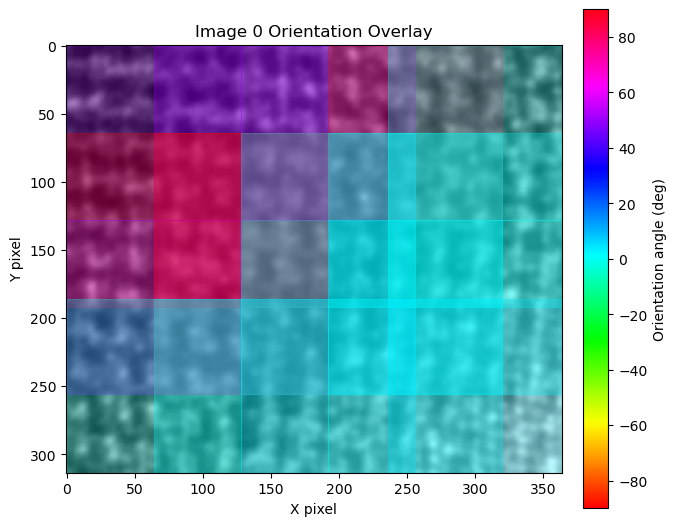

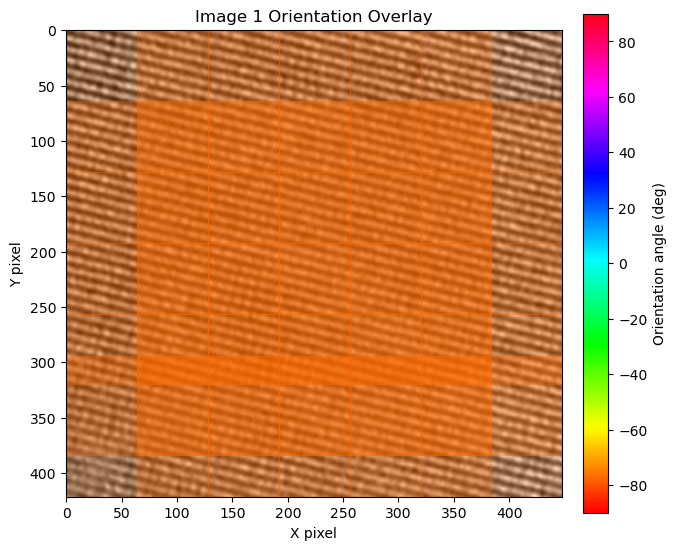

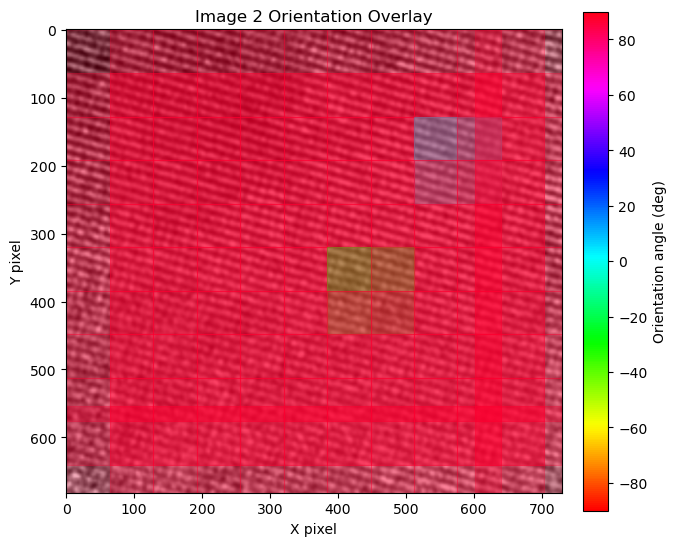

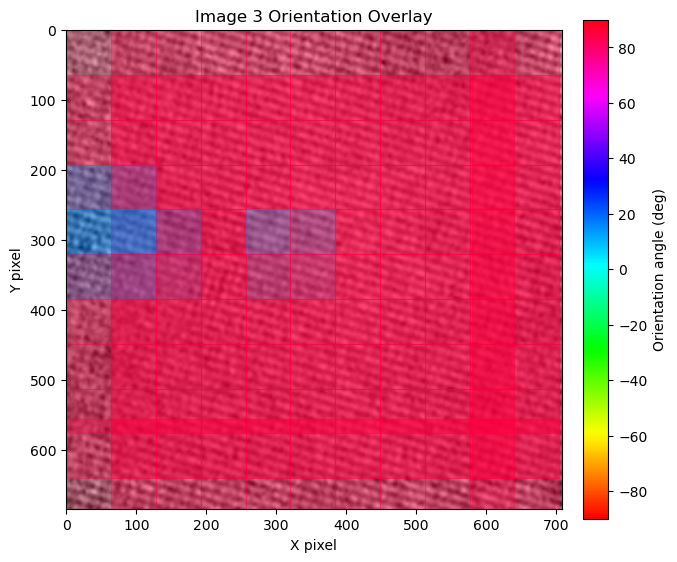

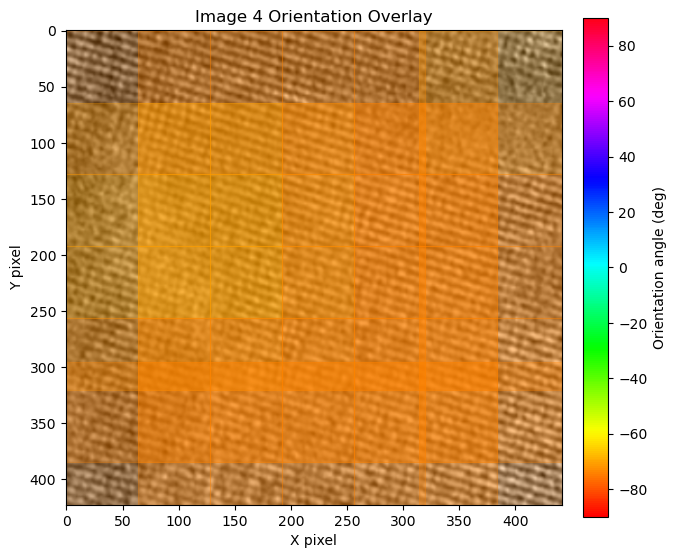

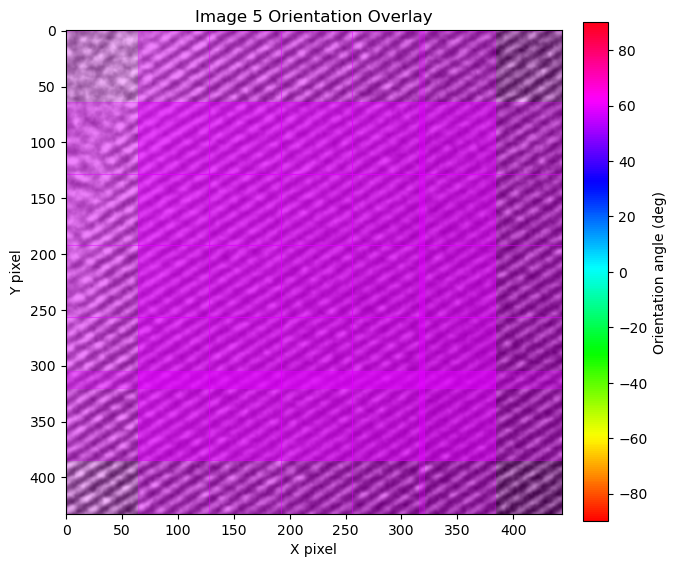

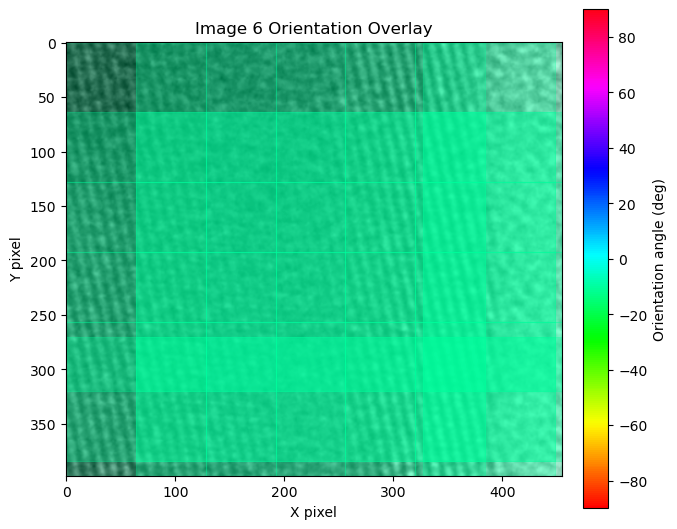

In [57]:
# Step 4-5: Generate orientation overlay for all images

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib as mpl

cmap = plt.cm.hsv
norm = mpl.colors.Normalize(vmin=-90, vmax=90)

for img_idx in range(len(blur_images)):

    img = blur_images[img_idx]
    coords = coords_all[img_idx]
    angles = angles_all[img_idx]

    fig, ax = plt.subplots(figsize=(7, 7))

    ax.imshow(img, cmap='gray')
    ax.set_title(f'Image {img_idx} Orientation Overlay', fontsize=12)
    ax.set_xlabel('X pixel')
    ax.set_ylabel('Y pixel')

    for (y, x), angle in zip(coords, angles):
        color = cmap(norm(angle))

        rect = patches.Rectangle(
            (x, y),              # top-left corner
            window_size,         # width
            window_size,         # height
            linewidth=0.8,
            edgecolor=color,
            facecolor=color,
            alpha=0.28
        )
        ax.add_patch(rect)

    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    cbar = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('Orientation angle (deg)')

    plt.show()

## Step 5-1: Compute Orientation Statistics for Each Image

### Explanation

To quantify orientation variation, we compute statistics from the local angles.

For each image:

- Remove invalid (`NaN`) values
- Convert FFT orientation to real lattice orientation (+90°, wrapped to [-90°, 90°])
- Compute:

  - Mean orientation (circular mean)
  - Standard deviation
  - Variance
  - Valid window ratio

These metrics allow comparison between different nanowire regions.

In [58]:
import numpy as np

orientation_stats = []

for i, angles in enumerate(angles_all):

    valid = angles[~np.isnan(angles)]

    # convert FFT orientation to real-lattice orientation
    valid = valid + 90
    valid = (valid + 90) % 180 - 90

    n_total = len(angles)
    n_valid = len(valid)
    ratio = n_valid / n_total if n_total else 0.0

    if n_valid:

        # circular mean
        sin_mean = np.mean(np.sin(np.deg2rad(valid)))
        cos_mean = np.mean(np.cos(np.deg2rad(valid)))
        mean_angle = np.rad2deg(np.arctan2(sin_mean, cos_mean))

        std_angle = np.std(valid)
        var_angle = np.var(valid)

    else:
        mean_angle = np.nan
        std_angle = np.nan
        var_angle = np.nan

    orientation_stats.append((mean_angle, std_angle, var_angle, ratio, n_total))

    print(f"Image {i}")
    print(f"windows total   = {n_total}")
    print(f"valid ratio     = {ratio:.2f}")
    print(f"mean orientation= {mean_angle:.2f} deg")
    print(f"std deviation   = {std_angle:.2f} deg")
    print(f"variance        = {var_angle:.2f}")
    print()

Image 0
windows total   = 20
valid ratio     = 1.00
mean orientation= -55.21 deg
std deviation   = 55.59 deg
variance        = 3090.10

Image 1
windows total   = 36
valid ratio     = 1.00
mean orientation= 12.99 deg
std deviation   = 0.00 deg
variance        = 0.00

Image 2
windows total   = 110
valid ratio     = 1.00
mean orientation= -3.51 deg
std deviation   = 9.88 deg
variance        = 97.60

Image 3
windows total   = 110
valid ratio     = 1.00
mean orientation= -7.22 deg
std deviation   = 13.00 deg
variance        = 169.11

Image 4
windows total   = 36
valid ratio     = 1.00
mean orientation= 16.98 deg
std deviation   = 1.66 deg
variance        = 2.76

Image 5
windows total   = 36
valid ratio     = 1.00
mean orientation= -30.96 deg
std deviation   = 0.00 deg
variance        = 0.00

Image 6
windows total   = 42
valid ratio     = 1.00
mean orientation= 79.82 deg
std deviation   = 0.29 deg
variance        = 0.09



## Step 5-2: Generate Orientation Heatmaps for All Images

### Explanation

We generate orientation heatmaps for every image in the dataset.

Each heatmap:

- Displays the 2D orientation grid
- Uses consistent color range [-90°, 90°]
- Allows direct comparison across nanowire regions

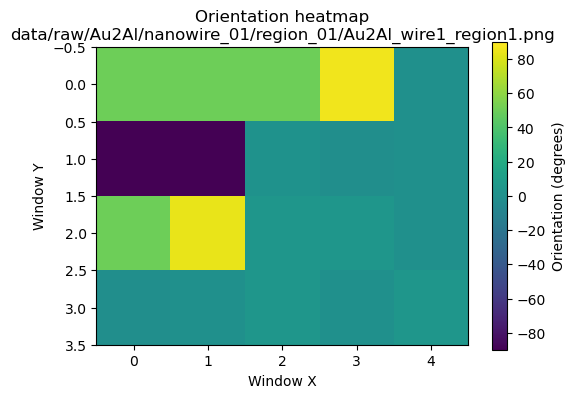

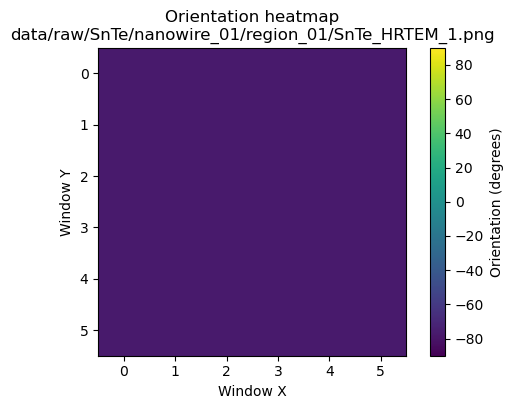

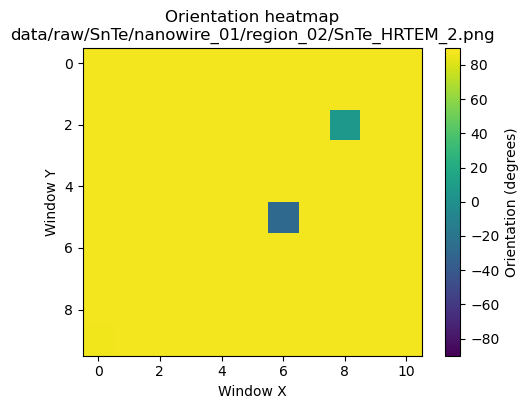

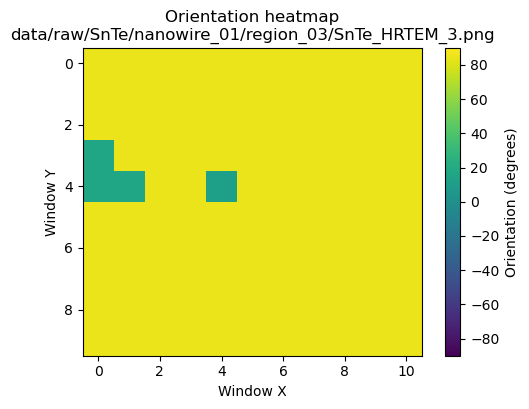

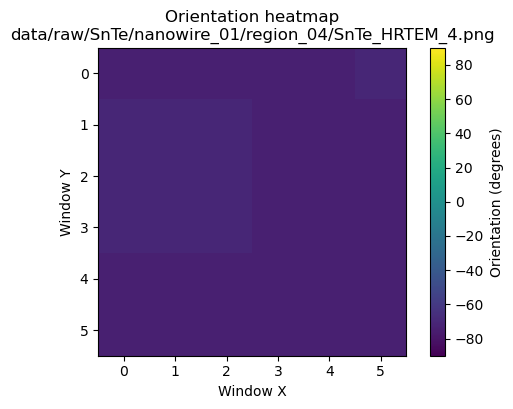

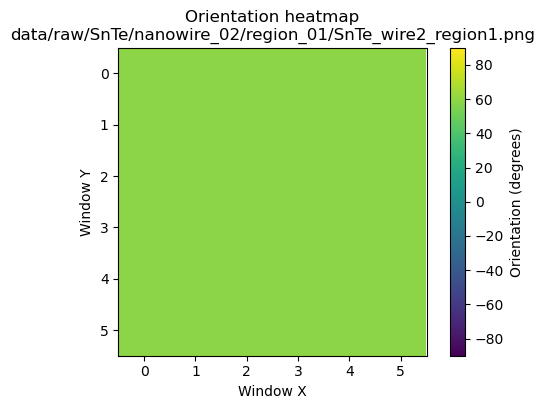

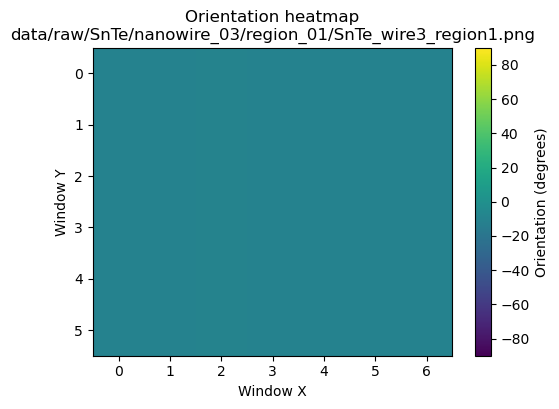

In [59]:
# Step 5-2: Generate Orientation Heatmaps for All Images

import matplotlib.pyplot as plt

for i, angle_map in enumerate(angle_maps_all):

    plt.figure(figsize=(6,4))

    plt.imshow(angle_map, cmap="viridis", vmin=-90, vmax=90)

    plt.title(f"Orientation heatmap\n{image_names[i]}")
    plt.xlabel("Window X")
    plt.ylabel("Window Y")

    plt.colorbar(label="Orientation (degrees)")

    plt.show()

## Step 5-3: Generate Orientation Histograms for All Images

### Explanation

To further analyze orientation distribution, we plot histograms  
of the valid local orientation angles.

Interpretation:

- Narrow peak → highly aligned lattice
- Broad distribution → larger orientation disorder

This provides an intuitive comparison of crystallographic alignment.

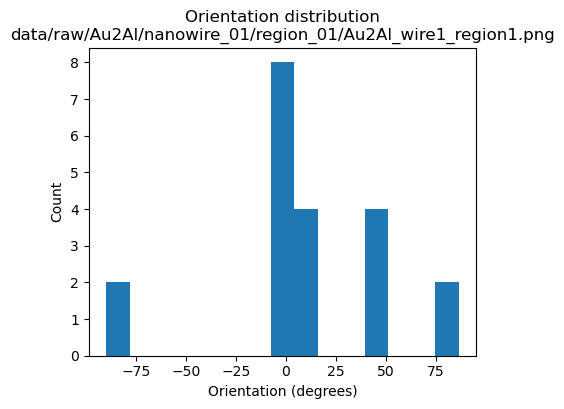

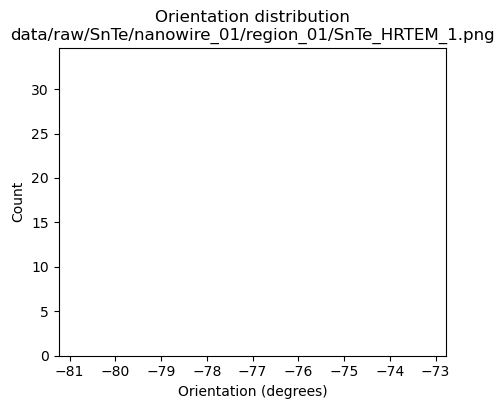

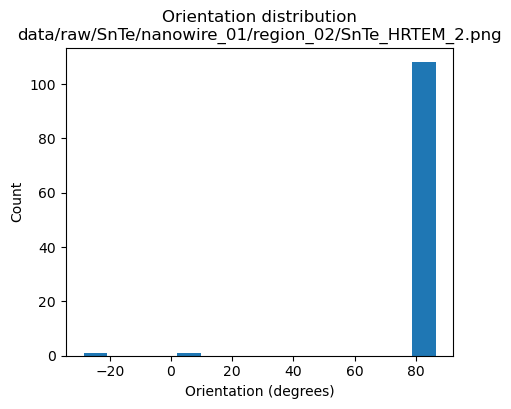

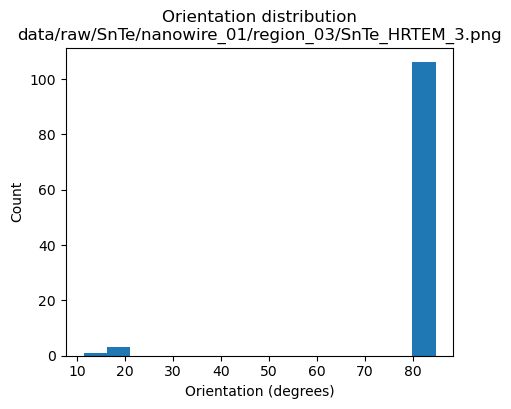

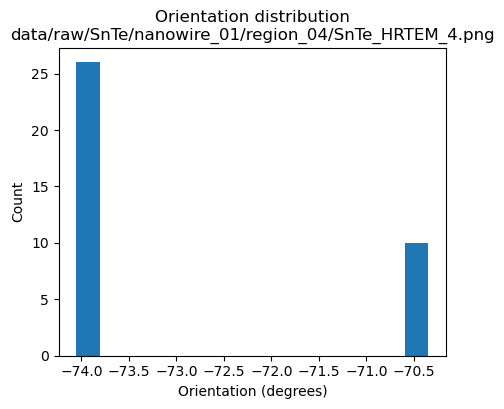

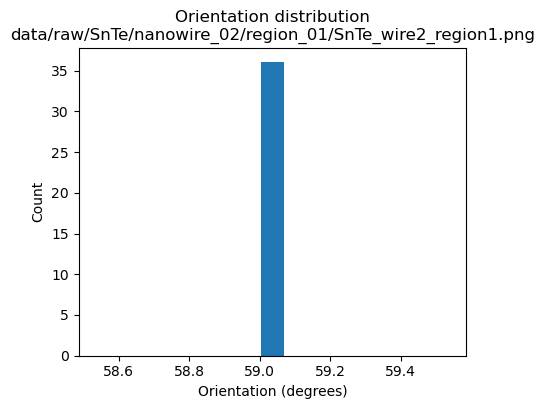

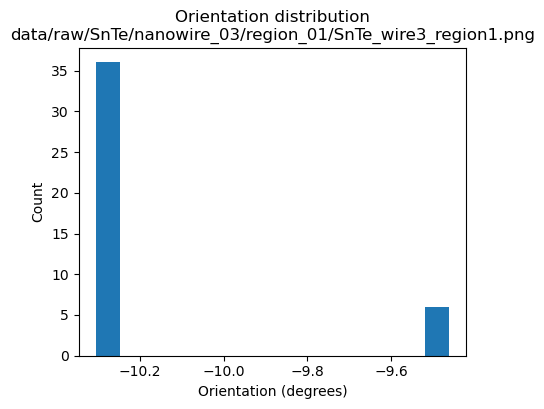

In [60]:
# Step 5-3: Generate Orientation Histograms for All Images

import numpy as np
import matplotlib.pyplot as plt

for i, angles in enumerate(angles_all):

    valid = angles[~np.isnan(angles)]

    plt.figure(figsize=(5,4))

    plt.hist(valid, bins=15)

    plt.title(f"Orientation distribution\n{image_names[i]}")
    plt.xlabel("Orientation (degrees)")
    plt.ylabel("Count")

    plt.show()

## Step 5-4: Compare Orientation Variation Across Images

### Explanation

To compare lattice disorder between nanowire regions,  
we visualize the orientation standard deviation for all images.

- Higher std → larger orientation fluctuation
- Lower std → more uniform crystal alignment

This provides a quantitative comparison across the dataset.

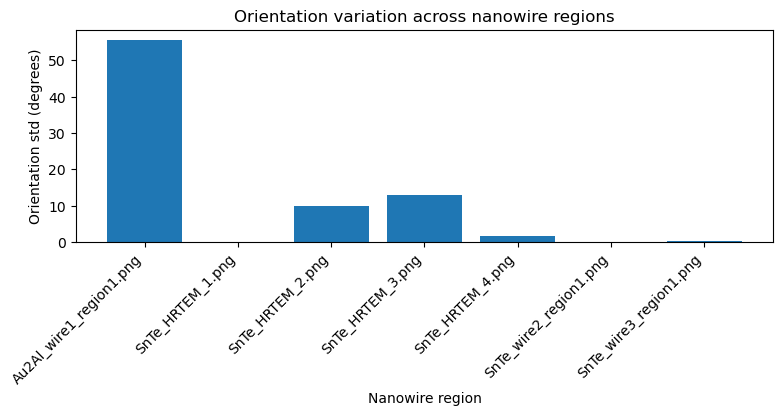

In [61]:
# Step 5-4: Compare Orientation Variation Across Images

import matplotlib.pyplot as plt
import numpy as np
import os

means = [s[0] for s in orientation_stats]
stds  = [s[1] for s in orientation_stats]

x = np.arange(len(means))

labels = [os.path.basename(n) for n in image_names]

plt.figure(figsize=(9,4))

plt.bar(x, stds)

plt.xticks(x, labels, rotation=45, ha="right")

plt.xlabel("Nanowire region")
plt.ylabel("Orientation std (degrees)")
plt.title("Orientation variation across nanowire regions")

plt.subplots_adjust(bottom=0.35)

plt.show()

## Step 6-1: Global Distribution of Orientation Angles from All Windows

### Explanation

To analyze the overall orientation distribution, we combine the local orientation values from selected nanowire regions.

Procedure:

1. Select target images (e.g., specific nanowire regions).
2. Estimate the nanowire axis orientation.
3. Convert FFT angles to real lattice orientation.
4. Compute relative orientation with respect to the wire axis.
5. Apply symmetry folding to keep angles within [-90°, 90°].
6. Filter low-strength FFT windows.
7. Plot the global histogram of relative orientations.

This reveals whether the dataset is dominated by specific lattice directions or shows broad orientation spread.

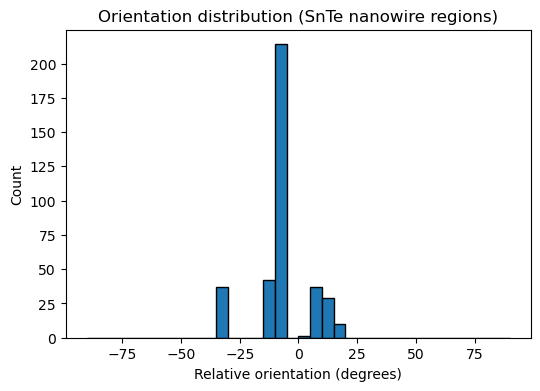

In [62]:
# Step 6-1: Global Distribution of Orientation Angles from All Windows

import numpy as np
import matplotlib.pyplot as plt

wire_angles = np.array(orientations)

all_rel_angles = []

# only analyze SnTe nanowire regions
target_indices = [i for i, name in enumerate(image_names) if "SnTe" in name]

# compute nanowire axis orientation (mean of global orientations)
wire_axis = np.nanmean(wire_angles[target_indices])

for i in target_indices:

    angles = angles_all[i]

    # convert FFT → real lattice
    angles = angles + 90
    angles = (angles + 90) % 180 - 90

    valid = ~np.isnan(angles)

    rel = angles[valid] - wire_axis
    rel = (rel + 90) % 180 - 90

    # axis symmetry
    rel = np.where(rel > 45, rel - 90, rel)
    rel = np.where(rel < -45, rel + 90, rel)

    all_rel_angles.append(rel)

all_rel_angles = np.concatenate(all_rel_angles)

plt.figure(figsize=(6,4))

plt.hist(all_rel_angles, bins=36, range=(-90,90), edgecolor="black")

plt.xlabel("Relative orientation (degrees)")
plt.ylabel("Count")
plt.title("Orientation distribution (SnTe nanowire regions)")

plt.show()

## Step 7-1: Intra-Wire Orientation Variance (Internal Consistency)

### Explanation

To evaluate lattice consistency within a single nanowire,  
we combine all local orientation values from its multiple regions.

Procedure:

- Concatenate angles from selected images of the same wire.
- Remove invalid values.
- Convert FFT orientation to real lattice orientation.
- Compute mean, standard deviation, and variance.

This quantifies internal lattice fluctuation within one nanowire.

In [63]:
# Step 7-1: Intra-Wire Orientation Variance (Internal Consistency)

import numpy as np

# SnTe wire 1 images（按你现在顺序是1,2,3,4）
wire1_idx = [1,2,3,4]

wire1_angles = np.concatenate([angles_all[i] for i in wire1_idx])
wire1_valid = wire1_angles[~np.isnan(wire1_angles)]

# convert FFT → real lattice
wire1_valid = wire1_valid + 90
wire1_valid = (wire1_valid + 90) % 180 - 90

print("SnTe nanowire 1")

print("mean orientation =", np.mean(wire1_valid))
print("std orientation  =", np.std(wire1_valid))
print("variance         =", np.var(wire1_valid))

SnTe nanowire 1
mean orientation = -0.5842381042294984
std orientation  = 13.577035062971158
variance         = 184.33588110114823


## Step 7-2: Compute Orientation Statistics for All Nanowires

### Explanation

To compare different nanowires, we compute statistics separately for each one.

For each nanowire:

1. Combine all its image regions.
2. Remove invalid values.
3. Convert FFT orientation to real lattice orientation.
4. Apply axis symmetry folding.
5. Compute:
   - Circular mean orientation
   - Standard deviation
   - Variance

This provides a quantitative comparison across nanowires.

In [64]:
# Step 7-2: Compute Orientation Statistics for All Nanowires

import numpy as np

nanowires = {
    "Au2Al_wire1": [0],
    "SnTe_wire1": [1,2,3,4],
    "SnTe_wire2": [5],
    "SnTe_wire3": [6]
}

nanowire_stats = {}

for name, idx_list in nanowires.items():

    angles = np.concatenate([angles_all[i] for i in idx_list])
    valid = angles[~np.isnan(angles)]

    # FFT → real lattice
    valid = valid + 90
    valid = (valid + 90) % 180 - 90

    # axis symmetry folding
    valid = np.where(valid > 45, valid - 90, valid)
    valid = np.where(valid < -45, valid + 90, valid)

    # circular mean
    sin_mean = np.mean(np.sin(np.deg2rad(valid)))
    cos_mean = np.mean(np.cos(np.deg2rad(valid)))
    mean = np.rad2deg(np.arctan2(sin_mean, cos_mean))

    std = np.std(valid)
    var = np.var(valid)

    nanowire_stats[name] = (mean, std, var)

    print(name)
    print("mean =", round(mean,2))
    print("std  =", round(std,2))
    print("var  =", round(var,2))
    print()

Au2Al_wire1
mean = -7.26
std  = 16.31
var  = 265.9

SnTe_wire1
mean = 0.62
std  = 8.77
var  = 76.83

SnTe_wire2
mean = -30.96
std  = 0.0
var  = 0.0

SnTe_wire3
mean = -10.18
std  = 0.29
var  = 0.09



## Step 7-3: Nanowire Orientation Variation Comparison

### Explanation

We compare nanowires by plotting the **standard deviation** of orientation.

- Higher standard deviation → larger internal lattice fluctuation
- Lower standard deviation → more uniform crystal alignment

This visualization highlights differences in lattice stability between nanowires.

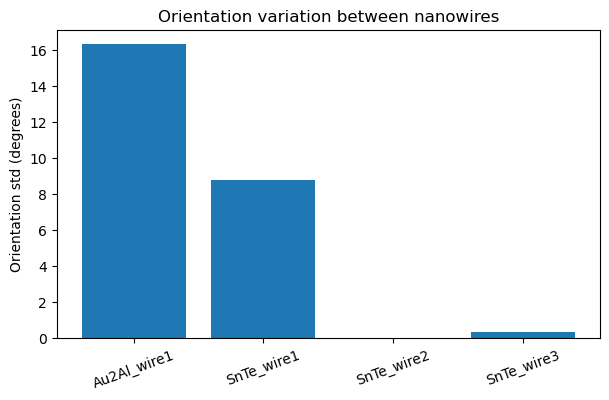

In [65]:
import matplotlib.pyplot as plt

names = list(nanowire_stats.keys())
std_values = [nanowire_stats[n][1] for n in names]

plt.figure(figsize=(7,4))

plt.bar(names, std_values)

plt.ylabel("Orientation std (degrees)")
plt.title("Orientation variation between nanowires")

plt.xticks(rotation=20)

plt.show()

## Step 7-4: Mean Orientation Comparison Between Nanowires

### Explanation

In addition to variation, we compare the **mean lattice orientation**  
for each nanowire.

This reveals whether different nanowires are aligned along different  
crystallographic directions.

The bar plot shows the mean orientation for direct comparison.

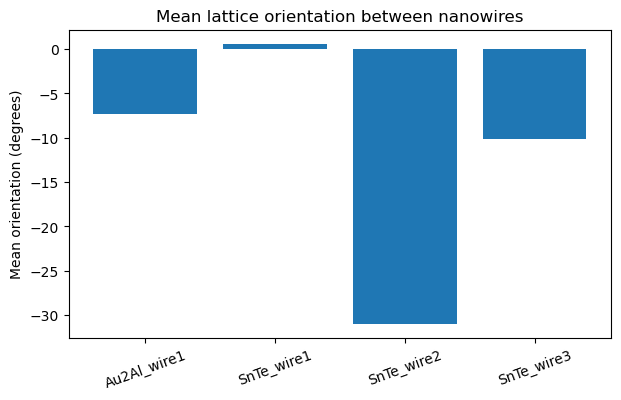

In [66]:
means = [nanowire_stats[n][0] for n in names]

plt.figure(figsize=(7,4))

plt.bar(names, means)

plt.ylabel("Mean orientation (degrees)")
plt.title("Mean lattice orientation between nanowires")

plt.xticks(rotation=20)

plt.show()